# Project imports

In [ ]:
!pip install aix360
!pip install shap
!pip install lime
!pip install pandas==1.3.4

     |████████████████████████████████| 58.3 MB 1.2 MB/s 
     |████████████████████████████████| 264 kB 54.4 MB/s 
     |████████████████████████████████| 109.3 MB 35 kB/s 
     |████████████████████████████████| 275 kB 41.6 MB/s 
     |████████████████████████████████| 109.7 MB 8.8 kB/s 
     |████████████████████████████████| 377 kB 54.8 MB/s 
     |████████████████████████████████| 50 kB 6.6 MB/s 
     |████████████████████████████████| 3.1 MB 41.5 MB/s 
     |████████████████████████████████| 488 kB 52.5 MB/s 
     |████████████████████████████████| 7.9 MB 45.7 MB/s 
     |████████████████████████████████| 121 kB 60.9 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 11.3 MB 41.6 MB/s 
  Created wheel for lime: filename=lime-0.1.1.37-py3-none-any.whl size=284290 sha256=c6b781df6032b988524b7571e7c69d916a13e482e788e4d4283f3d1482860002
  Stored in directory: /root

     |████████████████████████████████| 11.3 MB 7.6 MB/s 
  Attempting uninstall: pandas
    Found existing installation: pandas 1.3.5
    Uninstalling pandas-1.3.5:
      Successfully uninstalled pandas-1.3.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xport 3.5.0 requires pandas<1.4,>=1.3.5, but you have pandas 1.3.4 which is incompatible.
google-colab 1.0.0 requires pandas~=1.1.0; python_version >= "3.0", but you have pandas 1.3.4 which is incompatible.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import shap
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import pandas as pd

# Load the dataset

In [ ]:
from sklearn.metrics import classification_report
def report_scores(test_label, test_pred):
    print(classification_report(test_label, 
                            test_pred, 
                            target_names=['Strong Player', 'Weak Player']))

In [ ]:
players = pd.read_pickle('drive/MyDrive/dm_dataset/players_for_classification.pkl') #loading the dataframe for Player Profile
players_dt_nt = pd.read_pickle('drive/MyDrive/dm_dataset/players_dt_for_classification_nt.pkl') #loading the dataframe for Player Profile no tourney importance
players_dt = pd.read_pickle('drive/MyDrive/dm_dataset/players_dt_for_classification.pkl') #loading the dataframe for Player Profile
players_scaled = pd.read_pickle('drive/MyDrive/dm_dataset/players_scaled_for_classification.pkl')

In [ ]:

from sklearn.model_selection import train_test_split
label = players.pop('rank')
train_set, test_set, train_label, test_label = train_test_split(players, label, stratify = label, test_size=0.30, random_state=1)

# for dt
label_dt = players_dt.pop('rank')
train_set_dt, test_set_dt, train_label_dt, test_label_dt = train_test_split(players_dt, label_dt, stratify = label_dt, test_size=0.30, random_state=1)


# for dt
label_dt_nt = players_dt_nt.pop('rank')
train_set_dt_nt, test_set_dt_nt, train_label_dt_nt, test_label_dt_nt = train_test_split(players_dt_nt, label_dt_nt, stratify = label_dt_nt, test_size=0.30, random_state=1)


# scaled
label_scaled = players_scaled.pop('rank')
train_set_scaled, test_set_scaled, train_label_scaled, test_label_scaled = train_test_split(players_scaled, label_scaled, stratify = label_scaled, test_size=0.30, random_state = 1)

In [ ]:
random_picks = np.array([1, 101, 201, 301, 401, 501, 601, 701, 801])#np.arange(1,900,100) # Every 100 rows
S = test_set_scaled.iloc[random_picks]
S_label = test_label_scaled.iloc[random_picks]
S_nt = test_set_dt_nt.iloc[random_picks]
S_label_nt = test_label_dt_nt.iloc[random_picks]
S_dt = test_set_dt.iloc[random_picks]
S_label_dt = test_label_dt.iloc[random_picks]

In [ ]:
random_picks

array([  1, 101, 201, 301, 401, 501, 601, 701, 801])

In [ ]:
S_label

3620    1
3514    1
1244    1
654     1
1616    0
1896    1
4005    1
4117    0
1515    0
Name: rank, dtype: int64

# SVC explaination

In [ ]:
filename = "drive/MyDrive/dm_dataset/model_svm.pkl"
svm_blackbox = pickle.load(open(filename, 'rb'))
test_pred_svm = svm_blackbox.predict(test_set_scaled)
report_scores(test_label_scaled, test_pred_svm)

               precision    recall  f1-score   support

Strong Player       0.91      0.86      0.89       424
  Weak Player       0.89      0.92      0.91       491

     accuracy                           0.90       915
    macro avg       0.90      0.89      0.90       915
 weighted avg       0.90      0.90      0.90       915



## Global explaination SHAP

In [ ]:
train_summary = shap.kmeans(train_set_scaled, 10)
svm_explainer = shap.KernelExplainer(model=svm_blackbox.predict_proba, data=train_summary, link="logit")
svm_shap_values = svm_explainer.shap_values(test_set_scaled)

X does not have valid feature names, but SVC was fitted with feature names


  0%|          | 0/915 [00:00<?, ?it/s]

Output streaming troncato alle ultime 5000 righe.
If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight 

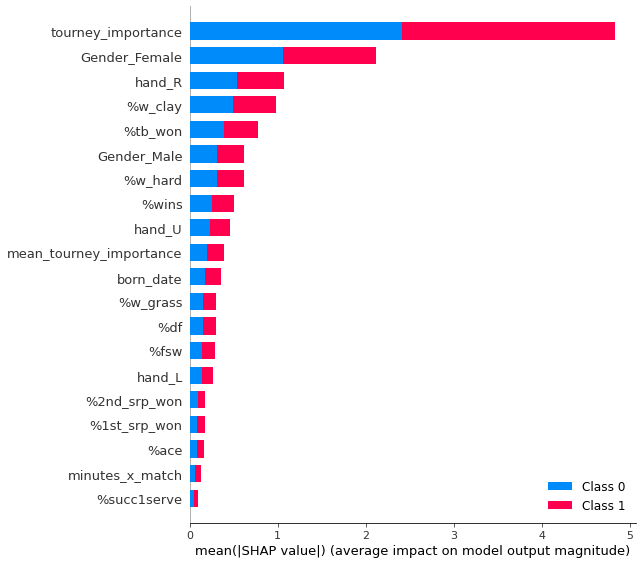

In [ ]:
shap.summary_plot(svm_shap_values, test_set_scaled)

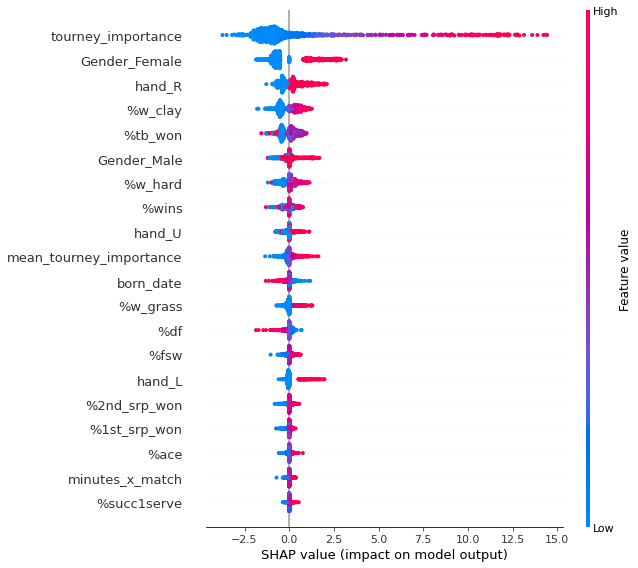

In [ ]:
shap.summary_plot(svm_shap_values[0], test_set_scaled)

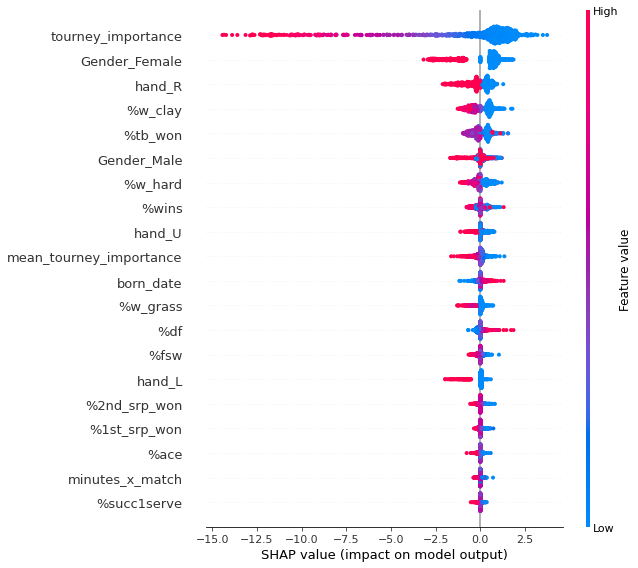

In [ ]:
shap.summary_plot(svm_shap_values[1], test_set_scaled)

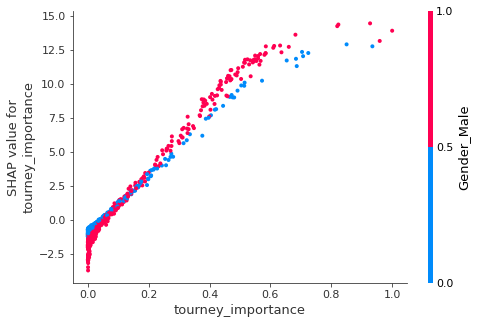

In [ ]:
shap.dependence_plot("tourney_importance", svm_shap_values[0], test_set_scaled)

## Local explaination SHAP

In [ ]:
svm_shap_values = svm_explainer.shap_values(S)
svm_shap_values = np.array(svm_shap_values)

  0%|          | 0/9 [00:00<?, ?it/s]

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will change from a conditional use of AIC to simply "num_features(10)"!
The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLarsIC())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
l1_reg="auto" is deprecated and in the next version (v0.29) the behavior will 

In [ ]:
j=0
shap.initjs()
shap.force_plot(svm_explainer.expected_value[0], svm_shap_values[0, j, :], S.iloc[j,:])

In [ ]:
j=2
shap.initjs()
shap.force_plot(svm_explainer.expected_value[0], svm_shap_values[0, j, :], S.iloc[j,:])

In [ ]:
shap.initjs()
shap.force_plot(svm_explainer.expected_value[0],svm_shap_values[0], S)

## Local explaination LIME

In [ ]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(train_set_scaled.values, feature_names = list(players_scaled.columns))

In [ ]:
svm_blackbox.predict(train_set_scaled.values[3].reshape(1,-1))

X does not have valid feature names, but SVC was fitted with feature names


array([0.])

In [ ]:
exp = lime_explainer.explain_instance(train_set_scaled.values[3], svm_blackbox.predict_proba, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but SVC was fitted with feature names


# Random Forest explaination

In [ ]:
%cd ..

/content


In [ ]:
filename = "drive/MyDrive/dm_dataset/model_rf.pkl"
rf_blackbox = pickle.load(open(filename, 'rb'))
test_pred_rf = rf_blackbox.predict(test_set_dt)
report_scores(test_label_dt, test_pred_rf)


               precision    recall  f1-score   support

Strong Player       0.92      0.89      0.91       424
  Weak Player       0.91      0.93      0.92       491

     accuracy                           0.91       915
    macro avg       0.91      0.91      0.91       915
 weighted avg       0.91      0.91      0.91       915



## Global explaination with SHAP

This variable importance plot lists the most significant variables in descending order. The top variables contribute more to the model than the bottom ones and thus have high predictive power.

We can see that the tourney_importance is the most important feature for both labels 0 and 1

In [ ]:
train_set_dt.shape

(2135, 22)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


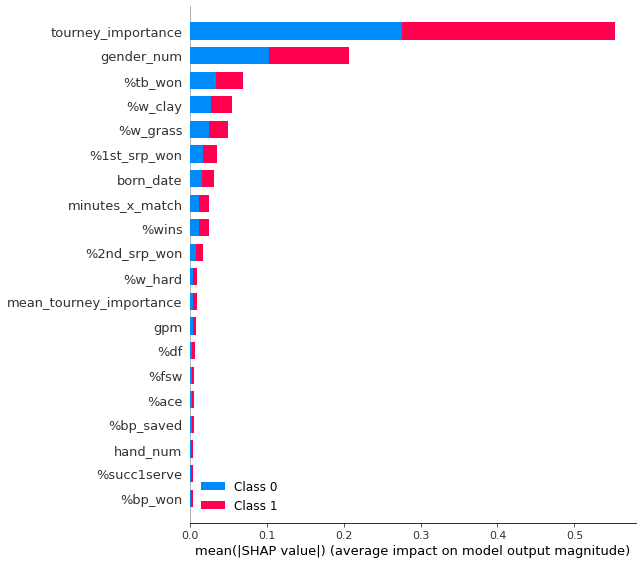

In [ ]:
rf_shap_values = shap.TreeExplainer(rf_blackbox).shap_values(train_set_dt)
f = plt.figure()
shap.summary_plot(rf_shap_values, train_set_dt, plot_type="bar")
#f.savefig("./summary_plot1.png", bbox_inches='tight', dpi=600)

The SHAP value plot can further show the positive and negative relationships of the predictors with the target variable. This plot is made of all the dots in the train data. It demonstrates the following information:
- **Feature importance**: Variables are ranked in descending order.
- **Impact** : The horizontal location shows whether the effect of that value is associated with a higher or lower prediction.
- **Original value**: Color shows whether that variable is high (in red) or low (in blue) for that observation.
- **Correlation**: A high level of the “tourney_importance” content has a high and positive impact on rank. The “high” comes from the red color, and the “positive” impact is shown on the X-axis. Similarly, we will say the “Gender Male” is negatively correlated with the target variable.

largehzza = quanto contribuisce globalmente per ogni spiegazione  
colore = su quale classe contribuisce  
spessore = per quanti esempi contribuisce con quel valore  

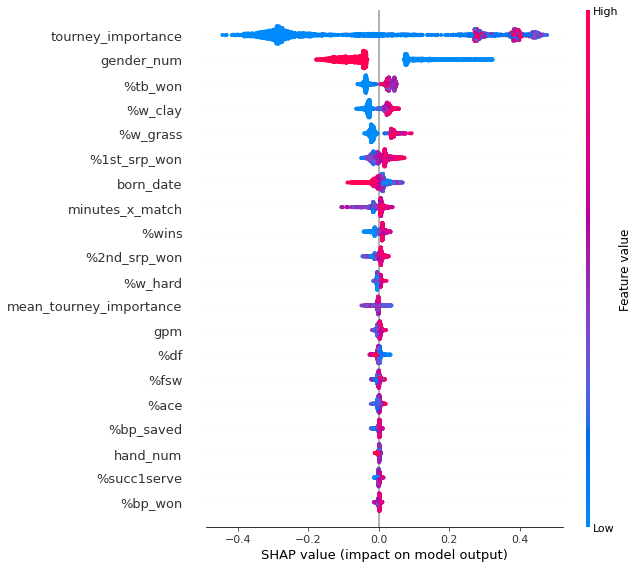

In [ ]:
shap.summary_plot(rf_shap_values[0], train_set_dt)

The partial dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic or more complex. The function automatically includes another variable that your chosen variable interacts most with. The following plot shows there is an approximately logaritmic and positive trend between “tourney_importance” and the target variable, and ““tourney_importance”” interacts with Gender_Male frequently.

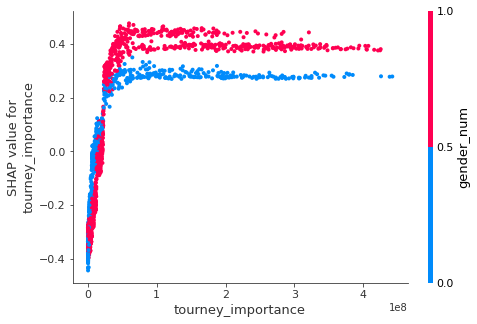

In [ ]:
shap.dependence_plot("tourney_importance", rf_shap_values[0], train_set_dt)

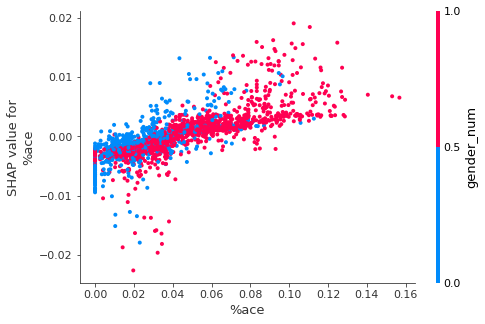

In [ ]:
shap.dependence_plot("%ace", rf_shap_values[0], train_set_dt)

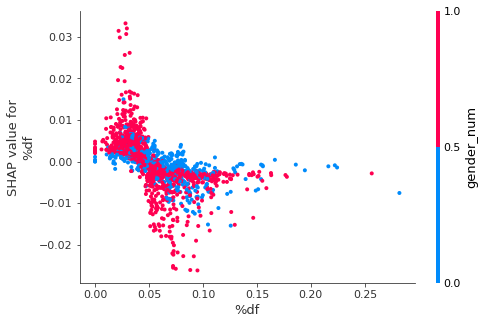

In [ ]:
shap.dependence_plot("%df", rf_shap_values[0], train_set_dt)

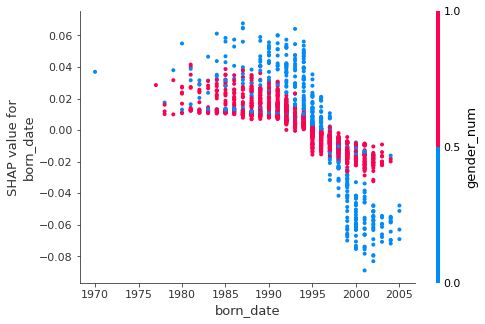

In [ ]:
shap.dependence_plot("born_date", rf_shap_values[0], train_set_dt)

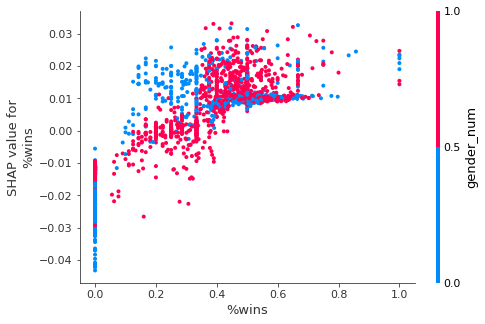

In [ ]:
shap.dependence_plot("%wins", rf_shap_values[0], train_set_dt)

## SHAP local explaination

In [ ]:
explainerModel = shap.TreeExplainer(rf_blackbox)
shap_values_Model = np.array(explainerModel.shap_values(S_dt))


def shap_plot(j, model, S):
    shap.initjs()
    p = shap.force_plot(explainerModel.expected_value[0], shap_values_Model[0, j, :], S.iloc[j,:])
    return(p)

def shap_decisionplot(j, model, S):
    shap.initjs()
    p = shap.decision_plot(
          base_value=explainerModel.expected_value[0],
          shap_values=shap_values_Model[0][j],
          features=S.iloc[j],
          feature_names=S.columns.tolist(),
          link="identity",
          new_base_value=0.5,
          )
    return(p)

def shap_forceplot(model, S):
  shap.initjs()
  p = shap.force_plot(explainerModel.expected_value[0], shap_values_Model[0,:, :], S.iloc[:, :])
  return(p)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [ ]:
rf_blackbox.predict(S_dt)

array([1, 1, 1, 1, 0, 1, 1, 0, 0])

In [ ]:
shap_plot(2, rf_blackbox, S_dt)

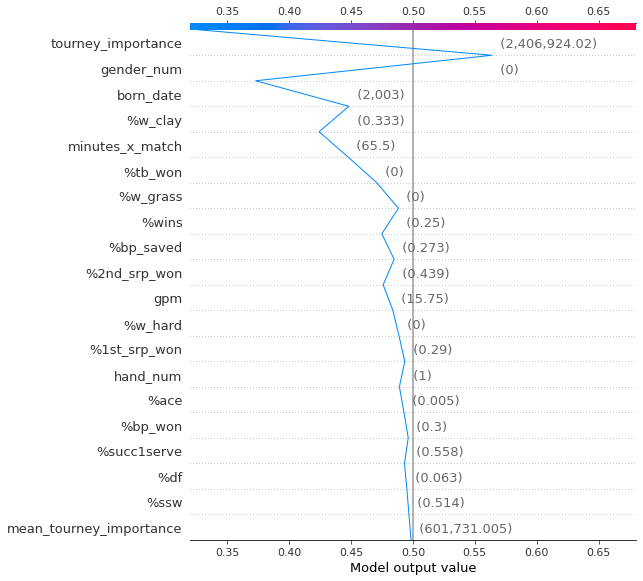

In [ ]:
shap_decisionplot(2,rf_blackbox,S_dt)

In [ ]:
shap_forceplot(rf_blackbox,S_dt)

## LIME local explaination

In [ ]:
lime_explainer = lime.lime_tabular.LimeTabularExplainer(train_set_dt.values, feature_names = list(players_dt.columns))

In [ ]:
# Explaination of the 4th sample of S dataframe
#top_labels is the nth neibhorbood
j=0
print("Predicted class: "+str(rf_blackbox.predict(S_dt.values[j].reshape(1,-1))))
lime_exp = lime_explainer.explain_instance(S_dt.values[j], rf_blackbox.predict_proba)
lime_exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


Predicted class: [1]


X does not have valid feature names, but RandomForestClassifier was fitted with feature names


In [ ]:
j=2
print("Predicted class: "+str(rf_blackbox.predict(S_dt.values[j].reshape(1,-1))))
lime_exp = lime_explainer.explain_instance(S_dt.values[j], rf_blackbox.predict_proba, top_labels=1)
lime_exp.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


Predicted class: [1]


X does not have valid feature names, but RandomForestClassifier was fitted with feature names


In [ ]:
rf_blackbox.predict_proba(S_dt.values[j].reshape(1,-1))

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


array([[0.32662499, 0.67337501]])

## LORE

In [ ]:
!git clone https://github.com/rinziv/XAI_lib_HAI-net_Tutorial
!pip install -r ./XAI_lib_HAI-net_Tutorial/requirements.txt
!mv XAI_lib_HAI-net_Tutorial xai
%cd xai

Cloning into 'XAI_lib_HAI-net_Tutorial'...
remote: Enumerating objects: 363, done.
remote: Counting objects: 100% (363/363), done.
remote: Compressing objects: 100% (287/287), done.
remote: Total 363 (delta 77), reused 349 (delta 63), pack-reused 0
Receiving objects: 100% (363/363), 229.56 MiB | 32.55 MiB/s, done.
Resolving deltas: 100% (77/77), done.
Checking out files: 100% (276/276), done.
     |████████████████████████████████| 88 kB 3.6 MB/s 
     |████████████████████████████████| 160 kB 18.3 MB/s 
  Created wheel for bitarray: filename=bitarray-2.3.4-cp37-cp37m-linux_x86_64.whl size=171952 sha256=d388c3a46222bac599ab0db6dd9bfb514994ad48e7283626d085d3e9210d8b1f
  Stored in directory: /root/.cache/pip/wheels/84/cc/5b/0e861bdb5294d22d2d4f595df936f964a95258387e11494d41
Successfully built bitarray
/content/xai


In [ ]:
from xailib.explainers.lore_explainer import LoreTabularExplainer
explainer = LoreTabularExplainer(rf_blackbox)
config = {'neigh_type':'geneticp', 'size':1000, 'ocr':0.1, 'ngen':10}
train_wlabel = train_set_dt.copy()
train_wlabel['rank'] = train_label_dt
explainer.fit(train_wlabel, 'rank', config)

In [ ]:
j=2
exp = explainer.explain(S_dt.values[j])

[[<externals.lore.lore.rule.Condition object at 0x7fbcd2b27c10>], [<externals.lore.lore.rule.Condition object at 0x7fbcd2f7e350>]]


In [ ]:
exp.plotRules()

In [ ]:
exp.plotCounterfactualRules()

## Evaluation

In [ ]:
from aix360.metrics import faithfulness_metric, monotonicity_metric

In the context of feature importance based explanations, we can evaluate the explanations by:

1. Faithfulness. It aims to validate if the relevance scores indicate true importance: we expect higher importance values for attributes that greatly influence the final prediction. The faithfulness method incrementally removes each of the attributes deemed important by the explanation.
At each removal, the effect on the performance is evaluated. 
These values are then employed to compute the overall correlation between feature importance and model performance. 
This metrics corresponds to a value between -1 and 1: the higher the value, the better the faithfulness of the explanation. 
2. Monotonicity. It evaluates the effect of the explanation by querying the black box model, by incrementally adding each attribute in order of increasing importance. We expect that the black-box performance increases by adding more and more features, thereby resulting in monotonically increasing model performance. 
3. Fidelity. This metric aims at evaluating how good is the surrogate model at mimicking the black-box decisions. Available only for methods which construct a sorrogate model, as in the case of LIME.
(Many others evaluations, but a lot of them do not have an available implementation)

In [ ]:
# Evaluation on singular istance LIME
"""predicted_class = rf_blackbox.predict(S.values[0].reshape(1,-1))[0]
le = lime_exp.local_exp[predicted_class]
m = lime_exp.as_map()
x = S.values[0]
coefs = np.zeros(x.shape[0])
for v in le:
    coefs[v[0]] = v[1]
base = np.zeros(x.shape[0])
print("Faithfulness: ", faithfulness_metric(rf_blackbox, x, coefs, base))
print("Monotonity: ", monotonicity_metric(rf_blackbox, x, coefs, base))"""

Faithfulness:  0.6918615154271144
Monotonity:  False


In [ ]:
# Evaluation on singulare istance SHAP
"""predicted_class = rf_blackbox.predict(S.values[0].reshape(1,-1))[0]

x = S.values[0]
base = np.zeros(x.shape[0])
print("Faithfulness: ", faithfulness_metric(rf_blackbox, x, shap_values_Model[predicted_class][0], base))
print("Monotonity: ", monotonicity_metric(rf_blackbox, x, shap_values_Model[predicted_class][0], base))"""

Faithfulness:  0.9942340333225523
Monotonity:  False


In [ ]:
base = np.zeros(S_dt.shape[1])

In [ ]:
# SHAP metrics
ncases = S_dt.shape[0]
fait = np.zeros(ncases)
for i in range(ncases):
    predicted_class = rf_blackbox.predict(S_dt.values[i].reshape(1,-1))[0]
    fait[i] = faithfulness_metric(rf_blackbox, S_dt.values[i], shap_values_Model[predicted_class][i], base)

print("Faithfulness metric mean: ", np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))

Faithfulness metric mean:  0.3766499024434312
Faithfulness metric std. dev.: 0.535924680136488


In [ ]:
# LIME
ncases = S_dt.shape[0]
fait = np.zeros(ncases)
for i in range(ncases):
    predicted_class = rf_blackbox.predict(S_dt.values[i].reshape(1,-1))[0]
    exp = lime_explainer.explain_instance(S_dt.values[i], rf_blackbox.predict_proba, num_features=4, top_labels=1)
    le = exp.local_exp[predicted_class]
    m = exp.as_map()
    
    x = S_dt.values[i]
    coefs = np.zeros(x.shape[0])
    
    for v in le:
        coefs[v[0]] = v[1]
    fait[i] = faithfulness_metric(rf_blackbox, S_dt.values[i], coefs, base)

print("Faithfulness metric mean: ",np.mean(fait))
print("Faithfulness metric std. dev.:", np.std(fait))

Faithfulness metric mean:  0.43065920199377866
Faithfulness metric std. dev.: 0.5485298274794763


# Random Forest explaination without tourney importance

In [ ]:
filename = "drive/MyDrive/dm_dataset/model_rf_no_toruney.pkl"
rf_blackbox_nt = pickle.load(open(filename, 'rb'))
test_pred_rf_nt = rf_blackbox_nt.predict(train_set_dt_nt)
report_scores(train_label_dt_nt, test_pred_rf_nt)

               precision    recall  f1-score   support

Strong Player       0.92      0.90      0.91       988
  Weak Player       0.92      0.93      0.92      1147

     accuracy                           0.92      2135
    macro avg       0.92      0.92      0.92      2135
 weighted avg       0.92      0.92      0.92      2135



## Global explaination with SHAP

This variable importance plot lists the most significant variables in descending order. The top variables contribute more to the model than the bottom ones and thus have high predictive power.

We can see that the tourney_importance is the most important feature for both labels 0 and 1

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


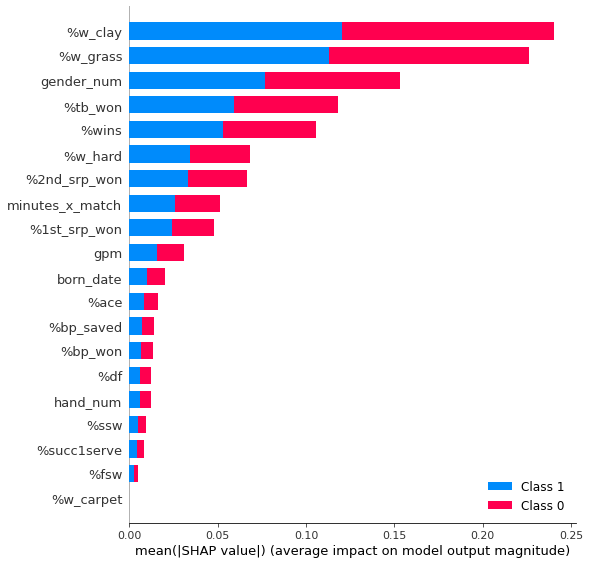

In [ ]:
rf_shap_values_nt = shap.TreeExplainer(rf_blackbox_nt).shap_values(train_set_dt_nt)
f = plt.figure()
shap.summary_plot(rf_shap_values_nt, train_set_dt_nt, plot_type="bar")
#f.savefig("./summary_plot1.png", bbox_inches='tight', dpi=600)

The SHAP value plot can further show the positive and negative relationships of the predictors with the target variable. This plot is made of all the dots in the train data. It demonstrates the following information:
- **Feature importance**: Variables are ranked in descending order.
- **Impact** : The horizontal location shows whether the effect of that value is associated with a higher or lower prediction.
- **Original value**: Color shows whether that variable is high (in red) or low (in blue) for that observation.
- **Correlation**: A high level of the “tourney_importance” content has a high and positive impact on rank. The “high” comes from the red color, and the “positive” impact is shown on the X-axis. Similarly, we will say the “Gender Male” is negatively correlated with the target variable.

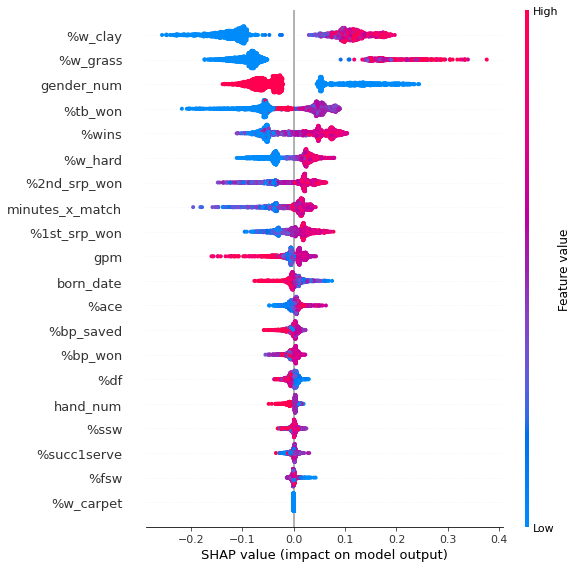

In [ ]:
shap.summary_plot(rf_shap_values_nt[0], train_set_dt_nt)

The partial dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic or more complex. The function automatically includes another variable that your chosen variable interacts most with. The following plot shows there is an approximately logaritmic and positive trend between “tourney_importance” and the target variable, and ““tourney_importance”” interacts with Gender_Male frequently.

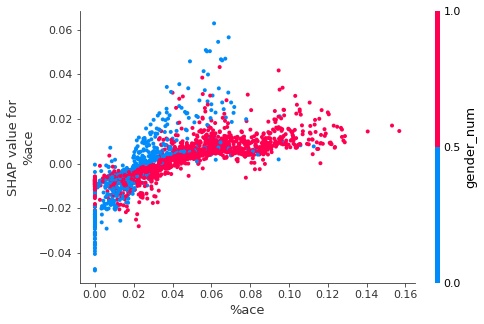

In [ ]:
shap.dependence_plot("%ace", rf_shap_values_nt[0], train_set_dt_nt)

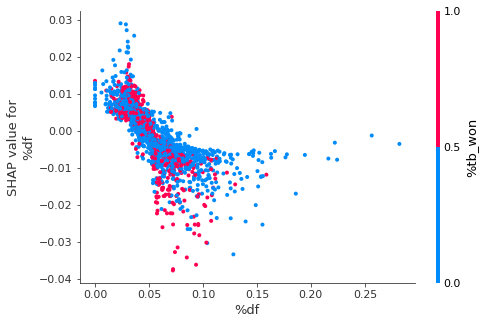

In [ ]:
shap.dependence_plot("%df", rf_shap_values_nt[0], train_set_dt_nt)

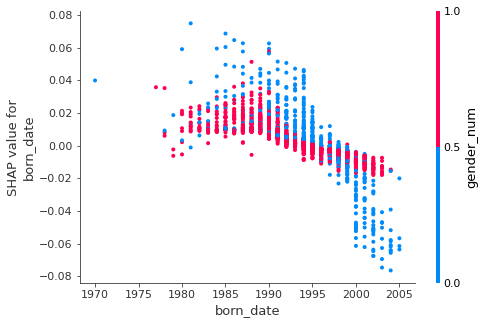

In [ ]:
shap.dependence_plot("born_date", rf_shap_values_nt[0], train_set_dt_nt)

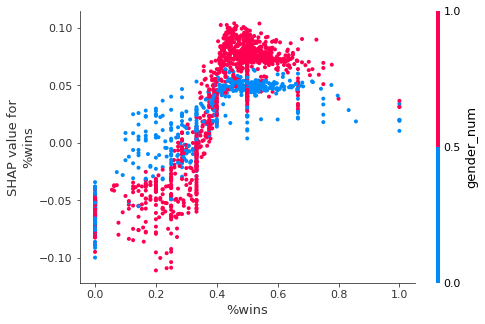

In [ ]:
shap.dependence_plot("%wins", rf_shap_values_nt[0], train_set_dt_nt)

## SHAP local explaination

In [ ]:
explainerModel_nt = shap.TreeExplainer(rf_blackbox_nt)
shap_values_Model_nt = np.array(explainerModel_nt.shap_values(S_nt))


def shap_plot(j, model, S):
    shap.initjs()
    p = shap.force_plot(explainerModel_nt.expected_value[0], shap_values_Model_nt[0, j, :], S.iloc[j,:])
    return(p)

def shap_decisionplot(j, model, S):
    shap.initjs()
    p = shap.decision_plot(
          base_value=explainerModel_nt.expected_value[0],
          shap_values=shap_values_Model_nt[0][j],
          features=S.iloc[j],
          feature_names=S.columns.tolist(),
          link="identity",
          new_base_value=0.5,
          )
    return(p)

def shap_forceplot(model, S):
  shap.initjs()
  p = shap.force_plot(explainerModel_nt.expected_value[0], shap_values_Model_nt[0,:, :], S.iloc[:, :])
  return(p)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


In [ ]:
rf_blackbox_nt.predict(S_nt)

array([1, 1, 1, 1, 0, 1, 1, 0, 0])

In [ ]:
shap_plot(2, rf_blackbox_nt, S_nt)

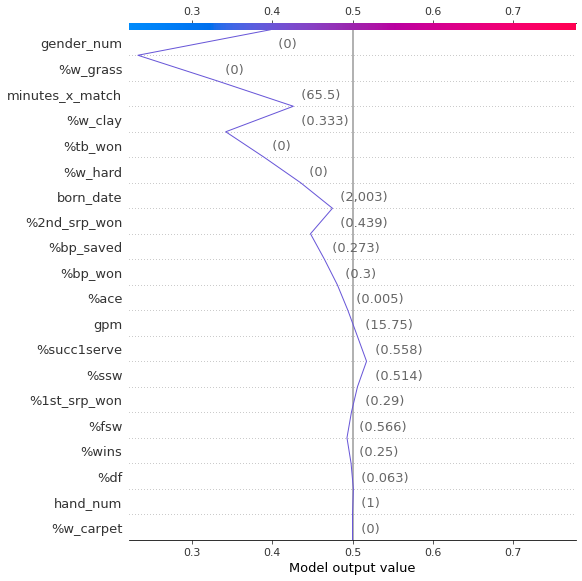

In [ ]:
shap_decisionplot(2,rf_blackbox_nt,S_nt)

In [ ]:
shap_forceplot(rf_blackbox_nt,S_nt)

## LIME local explaination

In [ ]:
lime_explainer_nt = lime.lime_tabular.LimeTabularExplainer(train_set_dt_nt.values, feature_names = list(players_dt_nt.columns))

In [ ]:
# Explaination of the 4th sample of S dataframe
#top_labels is the nth neibhorbood
j=0
print("Predicted class: "+str(rf_blackbox_nt.predict(S_nt.values[j].reshape(1,-1))))
lime_exp_nt = lime_explainer_nt.explain_instance(S_nt.values[j], rf_blackbox_nt.predict_proba)
lime_exp_nt.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


Predicted class: [1]


X does not have valid feature names, but RandomForestClassifier was fitted with feature names


In [ ]:
j=2
print("Predicted class: "+str(rf_blackbox_nt.predict(S_nt.values[j].reshape(1,-1))))
lime_exp_nt = lime_explainer_nt.explain_instance(S_nt.values[j], rf_blackbox_nt.predict_proba, top_labels=1)
lime_exp_nt.show_in_notebook(show_table=True, show_all=False)

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


Predicted class: [1]


X does not have valid feature names, but RandomForestClassifier was fitted with feature names


In [ ]:
rf_blackbox_nt.predict_proba(S_nt.values[j].reshape(1,-1))

X does not have valid feature names, but RandomForestClassifier was fitted with feature names


array([[0.39765422, 0.60234578]])

## LORE

In [ ]:
!git clone https://github.com/rinziv/XAI_lib_HAI-net_Tutorial
!pip install -r ./XAI_lib_HAI-net_Tutorial/requirements.txt
!mv XAI_lib_HAI-net_Tutorial xai
%cd xai

Cloning into 'XAI_lib_HAI-net_Tutorial'...
remote: Enumerating objects: 363, done.
remote: Counting objects: 100% (363/363), done.
remote: Compressing objects: 100% (287/287), done.
remote: Total 363 (delta 77), reused 349 (delta 63), pack-reused 0
Receiving objects: 100% (363/363), 229.56 MiB | 13.55 MiB/s, done.
Resolving deltas: 100% (77/77), done.
Checking out files: 100% (276/276), done.
/content/xai


In [ ]:
from xailib.explainers.lore_explainer import LoreTabularExplainer
explainer_nt = LoreTabularExplainer(rf_blackbox_nt)
config = {'neigh_type':'geneticp', 'size':1000, 'ocr':0.1, 'ngen':10}
train_wlabel_nt = train_set_dt_nt.copy()
train_wlabel_nt['rank'] = train_label_dt_nt
explainer_nt.fit(train_wlabel_nt, 'rank', config)

In [ ]:
j=2
exp_nt = explainer_nt.explain(S_nt.values[j])

In [ ]:
exp_nt.plotRules()

In [ ]:
exp_nt.plotCounterfactualRules()

## Evaluation

In [ ]:
from aix360.metrics import faithfulness_metric, monotonicity_metric

In the context of feature importance based explanations, we can evaluate the explanations by:

1. Faithfulness:  reveals the correlation between the importance assigned by the interpretability algorithm and the effect of each of the attributes on the performance of the predictive model.
2. Monotonicity: evaluates the effect of the explanation by querying the black-box model, by incrementally adding each attribute in order of increasing importance.
3. Fidelity: evaluates how good is the surrogate model at mimicking the black-box decisions. Available only for methods that construct a surrogate model.

In [ ]:
base_nt = np.zeros(S_nt.shape[1])

In [ ]:
# SHAP metrics
ncases_nt = S_nt.shape[0]
fait_nt = np.zeros(ncases_nt)
for i in range(ncases_nt):
    predicted_class = rf_blackbox_nt.predict(S_nt.values[i].reshape(1,-1))[0]
    fait_nt[i] = faithfulness_metric(rf_blackbox_nt, S_nt.values[i], shap_values_Model_nt[predicted_class][i], base_nt)

print("Faithfulness metric mean: ", np.mean(fait_nt))
print("Faithfulness metric std. dev.:", np.std(fait_nt))

Faithfulness metric mean:  0.47674970546845596
Faithfulness metric std. dev.: 0.28454218350159394


In [ ]:
# LIME
ncases_nt = S.shape[0]
fait_nt = np.zeros(ncases_nt)
for i in range(ncases_nt):
    predicted_class = rf_blackbox_nt.predict(S_nt.values[i].reshape(1,-1))[0]
    exp = lime_explainer_nt.explain_instance(S_nt.values[i], rf_blackbox_nt.predict_proba, num_features=4, top_labels=1)
    le = exp.local_exp[predicted_class]
    m = exp.as_map()
    
    x = S_nt.values[i]
    coefs = np.zeros(x.shape[0])
    
    for v in le:
        coefs[v[0]] = v[1]
    fait_nt[i] = faithfulness_metric(rf_blackbox_nt, S_nt.values[i], coefs, base_nt)

print("Faithfulness metric mean: ",np.mean(fait_nt))
print("Faithfulness metric std. dev.:", np.std(fait_nt))

Faithfulness metric mean:  0.4068856005021367
Faithfulness metric std. dev.: 0.2120843094607009
